### Notebook for the label transfer of WT mice CMC to rest of CMC genotypes with `scANVI`

- **Developed by:** Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology - Faculty of Medicine - Julius-Maximilian-Universität Würzburg**
- v240205

### Import required modules

In [1]:
import scvi
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import plotnine as p
from pywaffle import Waffle
import matplotlib.pyplot as plt
from scib_metrics.benchmark import Benchmarker

/home/ceger/miniforge3/envs/heart_multiome-env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
Cython              3.0.9
PIL                 10.2.0
absl                NA
annotated_types     0.6.0
anyio               NA
asttokens           NA
backoff             2.2.1
brotli              1.1.0
bs4                 4.12.3
certifi             2024.02.02
cffi                1.16.0
charset_normalizer  3.3.2
chex                0.1.85
click               8.1.7
colorama            0.4.6
comm                0.2.1
contextlib2         NA
croniter            NA
cycler              0.12.1
cython              3.0.9
cython_runtime      NA
dateutil            2.9.0
debugpy             1.8.1
decorator           5.1.1
deepdiff            6.7.1
docrep              0.3.2
etils               1.7.0
exceptiongroup      1.2.0
executing           2.0.1
fastapi             0.110.0
flax                0.8.1
fsspec              2024.2.0
gmpy2               2.1.2
google              NA
h5py                3.10.0
idna                3.6
igraph          

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Global seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

### Read in data

In [5]:
heart_scANVI = sc.read_h5ad('../../../data/Kdm6aKO_ALL_GEX-CB_scANVI-CMC_ctl240205.raw.h5ad')
heart_scANVI

AnnData object with n_obs × n_vars = 10793 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [6]:
heart_scANVI.obs_names = [name.rsplit('-', 2)[0] for name in heart_scANVI.obs_names]
heart_scANVI.obs_names

Index(['AAACAGCCAGGCCATT-1-KDM6A_wt_11', 'AAACATGCAAACCTAT-1-KDM6A_wt_11',
       'AAACATGCACACCAAC-1-KDM6A_wt_11', 'AAACCAACAAACAACA-1-KDM6A_wt_11',
       'AAACCAACAGTTTCTC-1-KDM6A_wt_11', 'AAACCGAAGGTGAGAC-1-KDM6A_wt_11',
       'AAACCGAAGTCATTAG-1-KDM6A_wt_11', 'AAACCGCGTTAAGTGT-1-KDM6A_wt_11',
       'AAACCGCGTTACCGGG-1-KDM6A_wt_11', 'AAACGCGCAGTATGTT-1-KDM6A_wt_11',
       ...
       'TTTGAGTCATAAGCAA-1-GSKJ4_treat_52',
       'TTTGAGTCATGCAACC-1-GSKJ4_treat_52',
       'TTTGAGTCATGCTCCC-1-GSKJ4_treat_52',
       'TTTGCATTCGGTTTCC-1-GSKJ4_treat_52',
       'TTTGGCTGTAAGCACC-1-GSKJ4_treat_52',
       'TTTGGCTGTTCACCAT-1-GSKJ4_treat_52',
       'TTTGGTAAGGGATTAG-1-GSKJ4_treat_52',
       'TTTGTCTAGTACTGGT-1-GSKJ4_treat_52',
       'TTTGTCTAGTCATGCG-1-GSKJ4_treat_52',
       'TTTGTTGGTCCTAACT-1-GSKJ4_treat_52'],
      dtype='object', length=10793)

In [7]:
heart_scANVI.obs['seed_labels'] = heart_scANVI.obs['C_scANVI'].copy()
del(heart_scANVI.obs['C_scANVI'])
heart_scANVI

AnnData object with n_obs × n_vars = 10793 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

### Visualise cell type distribution per condition

In [8]:
heart_scANVI.obs['seed_labels'].value_counts()

seed_labels
vCM1    5804
vCM4    1857
vCM2    1725
vCM3    1407
Name: count, dtype: int64

In [9]:
pd.crosstab(heart_scANVI.obs['seed_labels'], heart_scANVI.obs['genotype'])

genotype,KO,Sham,Tx,WT
seed_labels,,,,
vCM1,1182,1320,1464,1838
vCM2,704,357,278,386
vCM3,179,501,439,288
vCM4,222,761,167,707


### Read in other unannotated dataset and split into groups

In [10]:
heart_scANVI.obs['genotype'].value_counts()

genotype
WT      3219
Sham    2939
Tx      2348
KO      2287
Name: count, dtype: int64

In [11]:
reference = heart_scANVI[heart_scANVI.obs['genotype'].isin(['WT', 'Sham'])]
reference

View of AnnData object with n_obs × n_vars = 6158 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [12]:
query = heart_scANVI[~heart_scANVI.obs['genotype'].isin(['WT', 'Sham'])]
query.obs['seed_labels'] = 'Unknown'
query

AnnData object with n_obs × n_vars = 4635 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [13]:
adata = reference.concatenate(query, batch_key = 'batch', batch_categories = ['reference', 'query'], join = 'inner')
adata

AnnData object with n_obs × n_vars = 10793 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

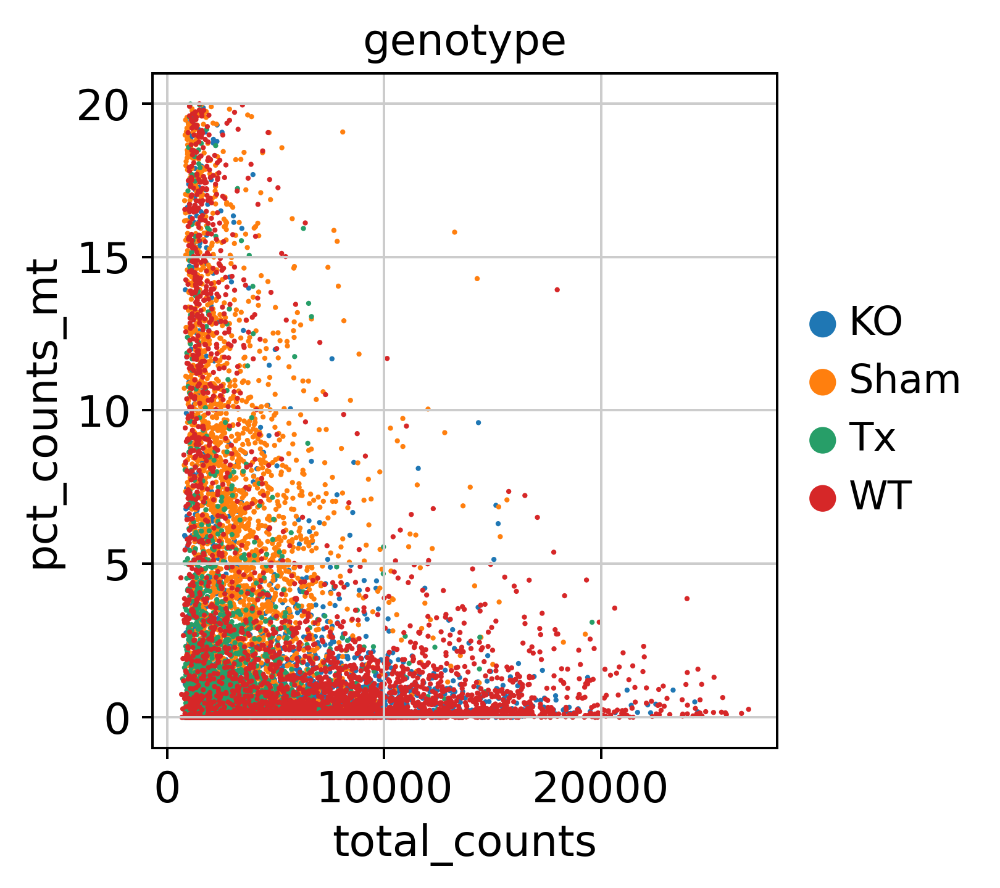

In [14]:
sc.pl.scatter(adata, x = 'total_counts', y = 'pct_counts_mt', color = "genotype", frameon = False)

In [15]:
adata.obs['genotype'].value_counts()

genotype
WT      3219
Sham    2939
Tx      2348
KO      2287
Name: count, dtype: int64

In [16]:
adata.obs['sample'].value_counts()

sample
KDM6A_wt_11       2390
GSKJ4_sham_51     1551
GSKJ4_sham_57     1388
KDM6A_KO_34       1221
GSKJ4_treat_47    1220
GSKJ4_treat_52    1128
KDM6A_KO_31       1066
KDM6A_wt_40        829
Name: count, dtype: int64

### Select HVGs

In [17]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "sample",
    subset = True,
    span = 1
)
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 10793 × 7000
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'genotype_colors', 'hvg'
    layers: 'counts'

### Transfer of annotation with scANVI

In [18]:
scvi.model.SCVI.setup_anndata(adata,
                              batch_key = "sample", 
                            categorical_covariate_keys = ["sample"], 
                            labels_key = "seed_labels", 
                            layer = 'counts')

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [19]:
scvi_model = scvi.model.SCVI(adata, 
                             n_latent = 50, 
                             n_layers = 3, 
                             dispersion = 'gene-batch', 
                             gene_likelihood = 'nb')

In [20]:
scvi_model.train(75, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = 'gpu',
                 devices= [0])

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 75/75: 100%|██████████| 75/75 [00:35<00:00,  2.30it/s, v_num=1, train_loss_step=1.83e+3, train_loss_epoch=1.86e+3]

`Trainer.fit` stopped: `max_epochs=75` reached.


Epoch 75/75: 100%|██████████| 75/75 [00:35<00:00,  2.09it/s, v_num=1, train_loss_step=1.83e+3, train_loss_epoch=1.86e+3]


In [21]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)

### Evaluate model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

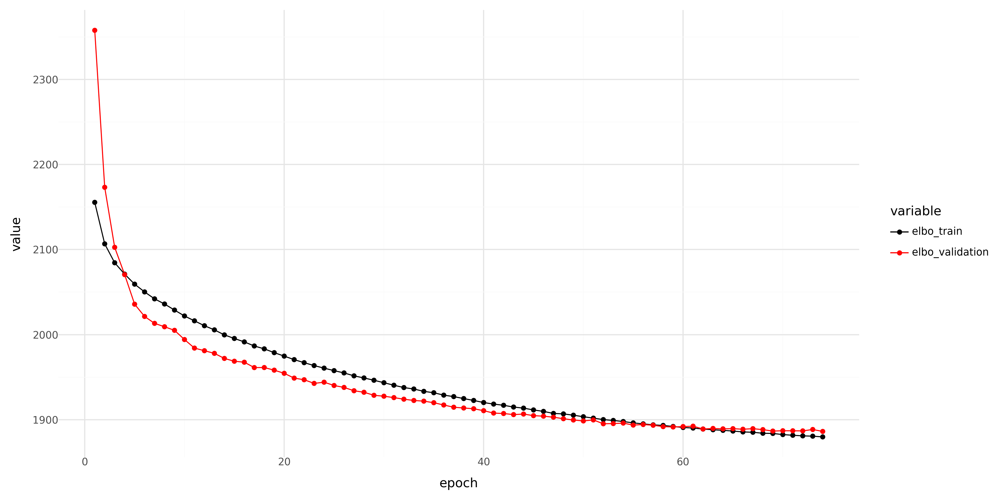

In [22]:
history_df = (
    scvi_model.history['elbo_train'].astype(float)
    .join(scvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

### Label transfer with `scANVI` 

In [23]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [24]:
scanvi_model.train(75, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = 'gpu',
                 devices= [0])

INFO     Training for 75 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 75/75: 100%|██████████| 75/75 [01:26<00:00,  1.15s/it, v_num=1, train_loss_step=1.81e+3, train_loss_epoch=1.83e+3]

`Trainer.fit` stopped: `max_epochs=75` reached.


Epoch 75/75: 100%|██████████| 75/75 [01:26<00:00,  1.16s/it, v_num=1, train_loss_step=1.81e+3, train_loss_epoch=1.83e+3]


In [25]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [26]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

### Explore model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

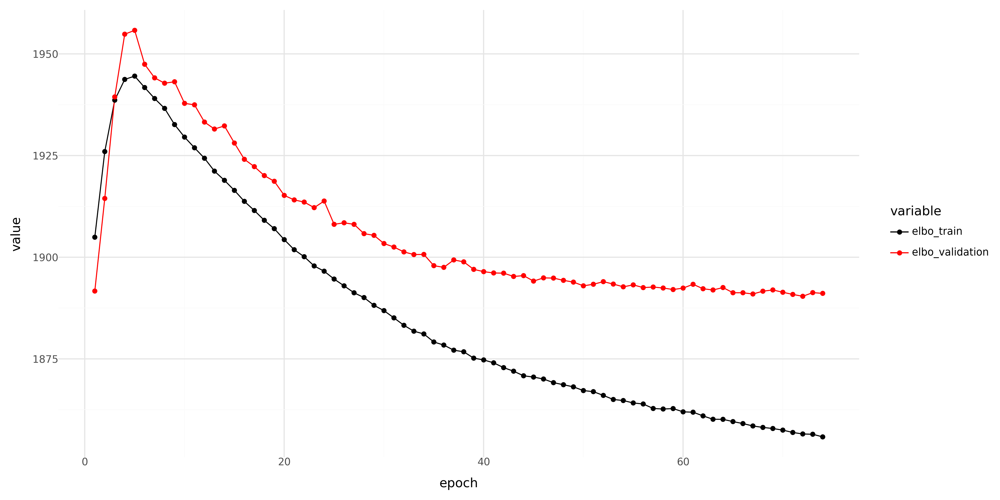

In [27]:
history_df = (
    scanvi_model.history['elbo_train'].astype(float)
    .join(scanvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

p_.save('fig1.png', dpi = 300)

print(p_)

### Visualise corrected dataset

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


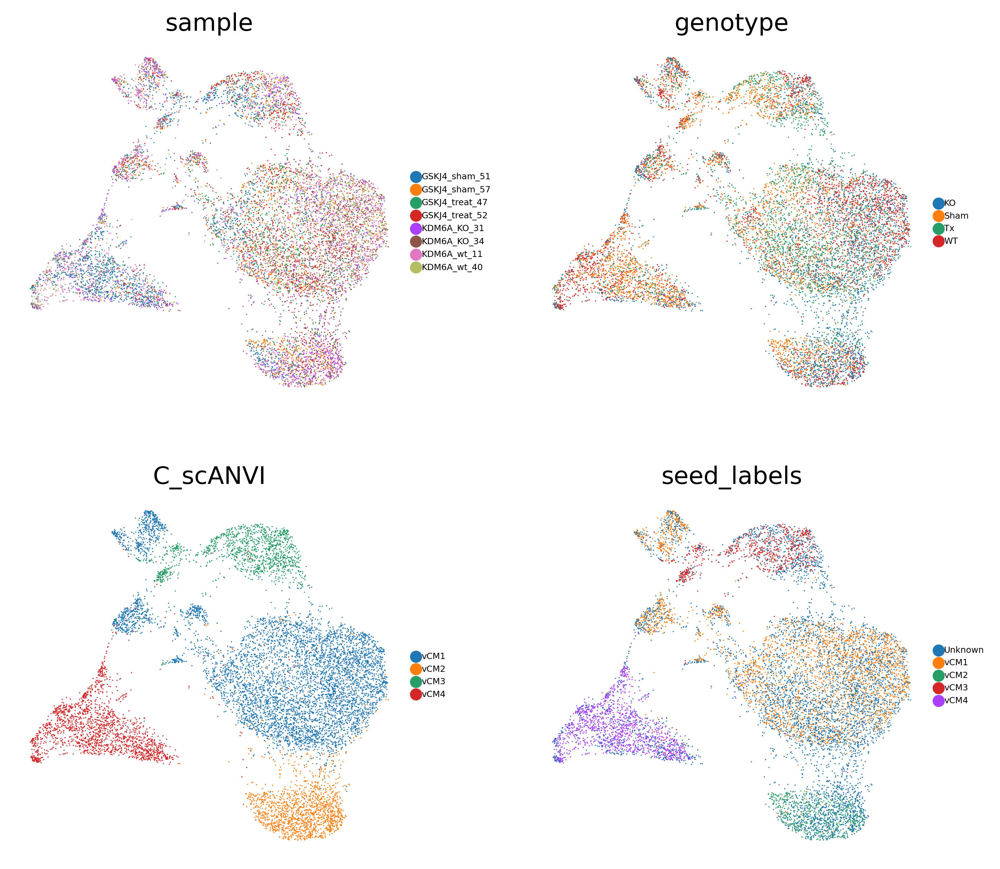

In [28]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.3, spread = 4, random_state = 1712)
sc.pl.umap(adata, frameon = False, color = ['sample', 'genotype', 'C_scANVI', 'seed_labels'], size = 2, legend_fontsize = 5, ncols = 2)

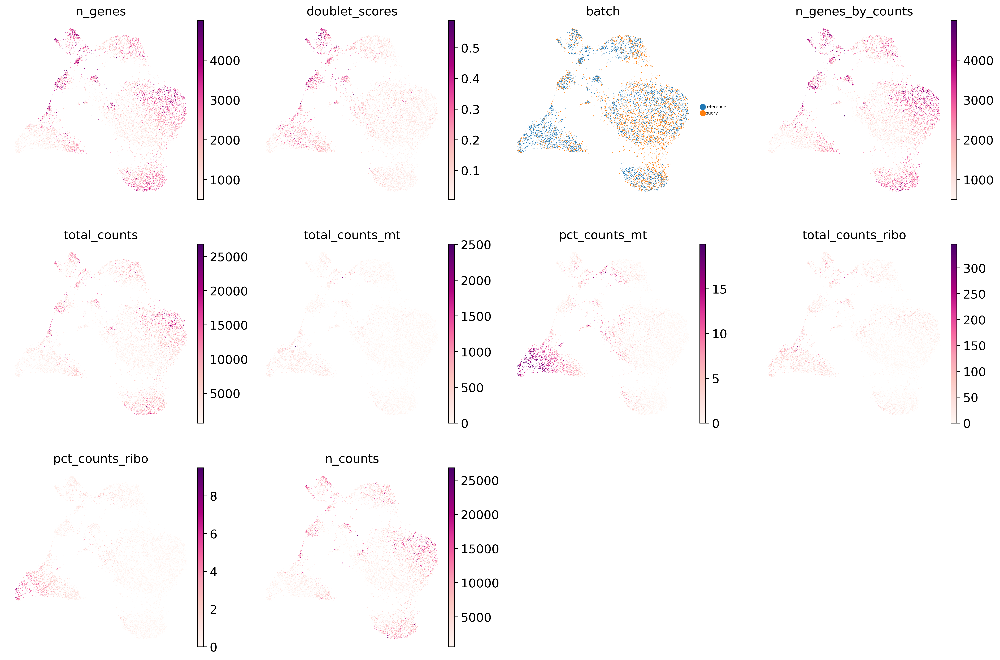

In [29]:
sc.pl.umap(adata, 
frameon = False, 
color = ['n_genes', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts'], 
size = 1.5, 
legend_fontsize = 5, 
ncols = 4, 
cmap = 'RdPu')

### Evaluate integration with `scIB-metrics`

In [30]:
adata.X = adata.X.astype(float)
adata.obsm['X_scVI'] = adata.obsm['X_scVI'].astype(float)
adata.obsm['X_scANVI'] = adata.obsm['X_scANVI'].astype(float)

In [31]:
bm = Benchmarker(
    adata,
    batch_key="sample",
    label_key="C_scANVI",
    embedding_obsm_keys = ["X_pca", "X_scVI", "X_scANVI"],
    n_jobs = -1,
)
bm.benchmark()

computing PCA
    with n_comps=50
    finished (0:00:04)


Embeddings: 100%|██████████| 3/3 [00:52<00:00, 17.63s/it]


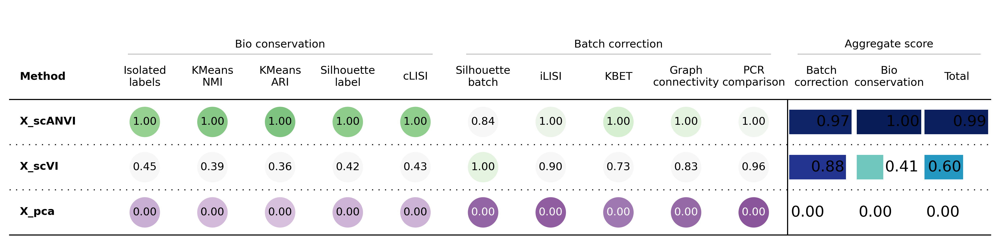

In [32]:
bm.plot_results_table()

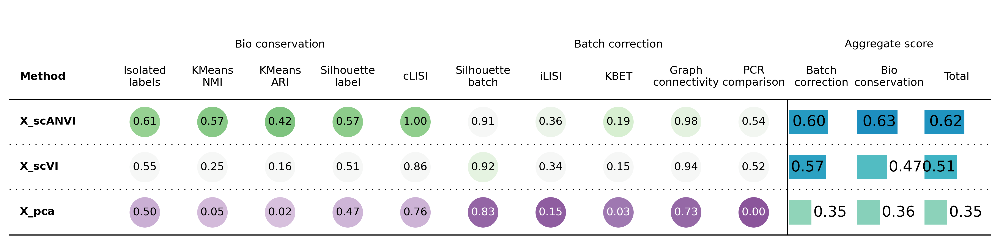

In [33]:
bm.plot_results_table(min_max_scale = False)

### Modify object to plot canonical marker genes

In [34]:
adata_toplot = anndata.AnnData(X = np.sqrt(sc.pp.normalize_total(adata_raw, inplace = False)["X"]), var = adata_raw.var, obs = adata.obs, obsm = adata.obsm)
adata_toplot

normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 10793 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: '_scvi_extra_categorical_covs', 'X_scVI', 'X_scANVI', 'X_umap', 'X_pca'

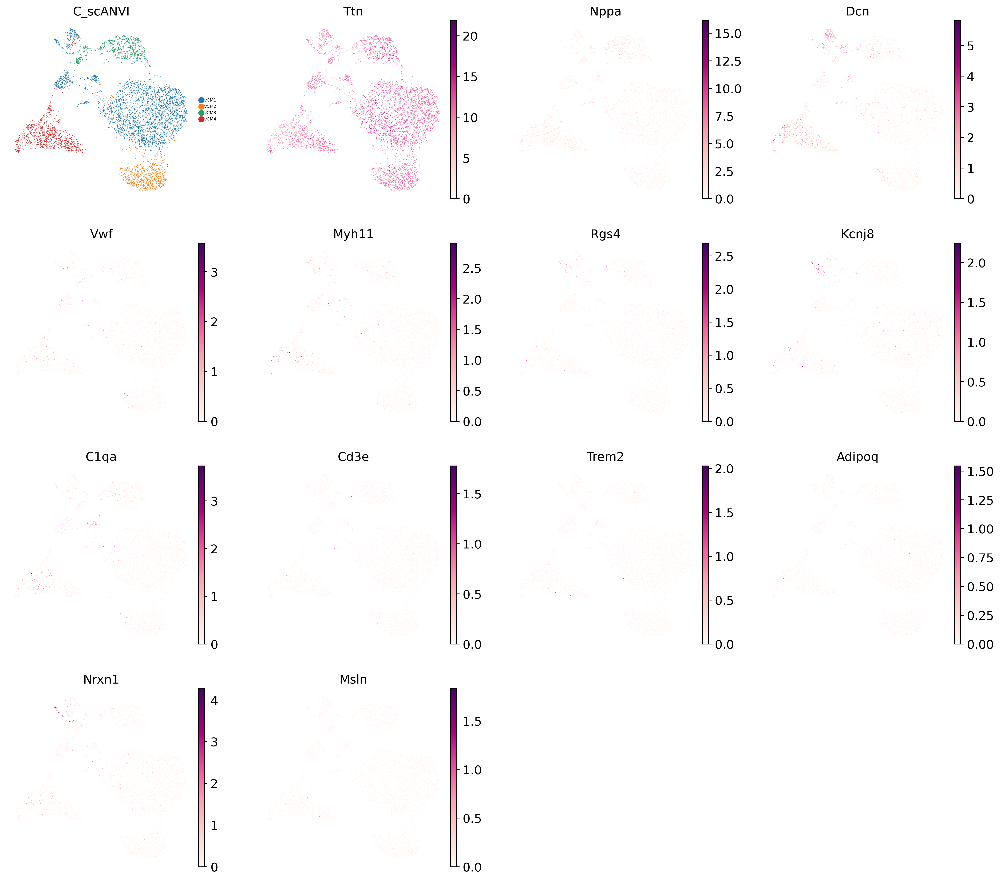

In [35]:
sc.pl.umap(adata_toplot, frameon = False, color = ['C_scANVI', 'Ttn', 'Nppa', 'Dcn', 'Vwf', 'Myh11', 'Rgs4', 'Kcnj8', 'C1qa', 'Cd3e', 'Trem2', 'Adipoq', 'Nrxn1', 'Msln'], size = 1.5, legend_fontsize = 5, ncols = 4, cmap = 'RdPu')

### Visualise proportions

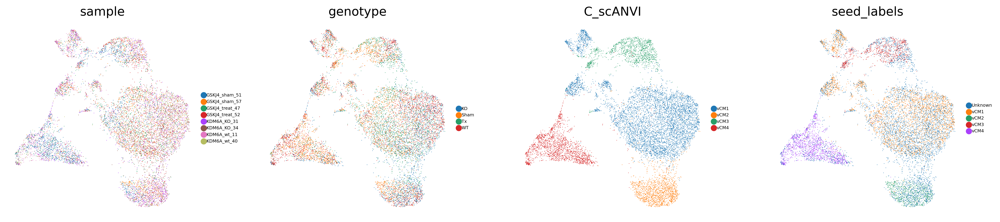

In [36]:
sc.pl.umap(adata, frameon = False, color = ['sample', 'genotype', 'C_scANVI', 'seed_labels'], size = 1.5, legend_fontsize = 5, ncols = 4)

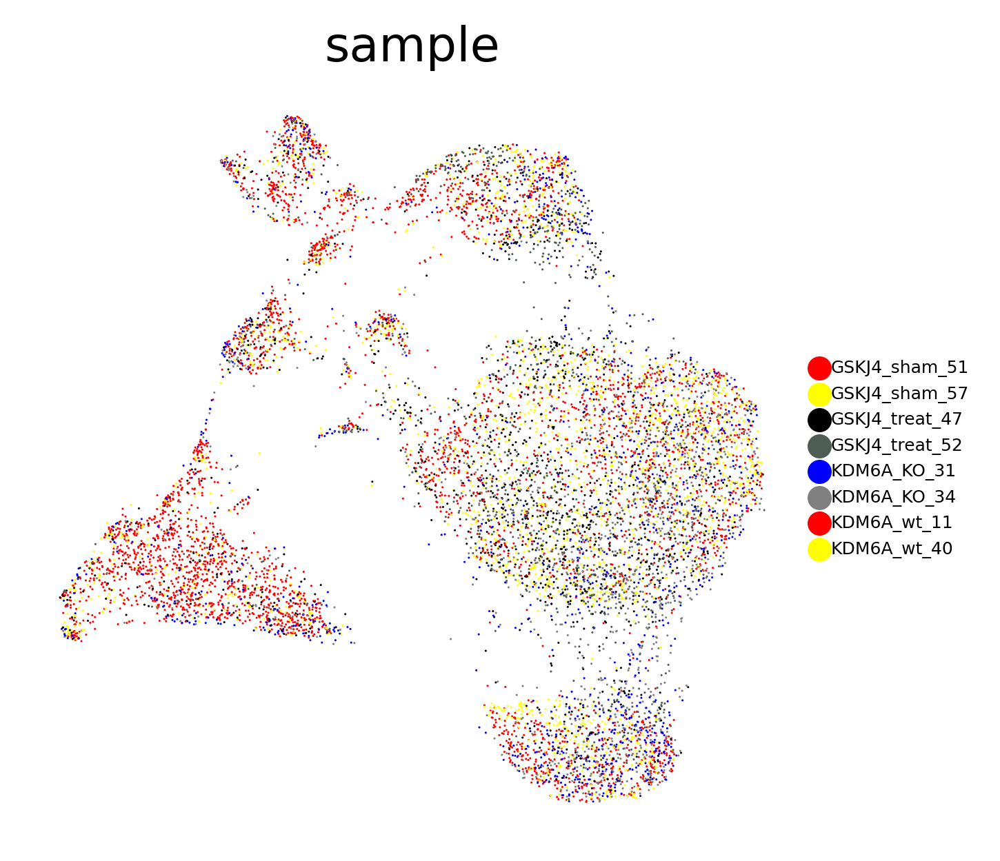

In [37]:
bauhaus_colors = ['#FF0000', '#FFFF00', '#000000', '#4D5D53', '#0000FF', '#808080']
sc.pl.umap(adata, frameon = False, color = ['sample'], size = 1.5, legend_fontsize = 5, ncols = 4, palette = bauhaus_colors)

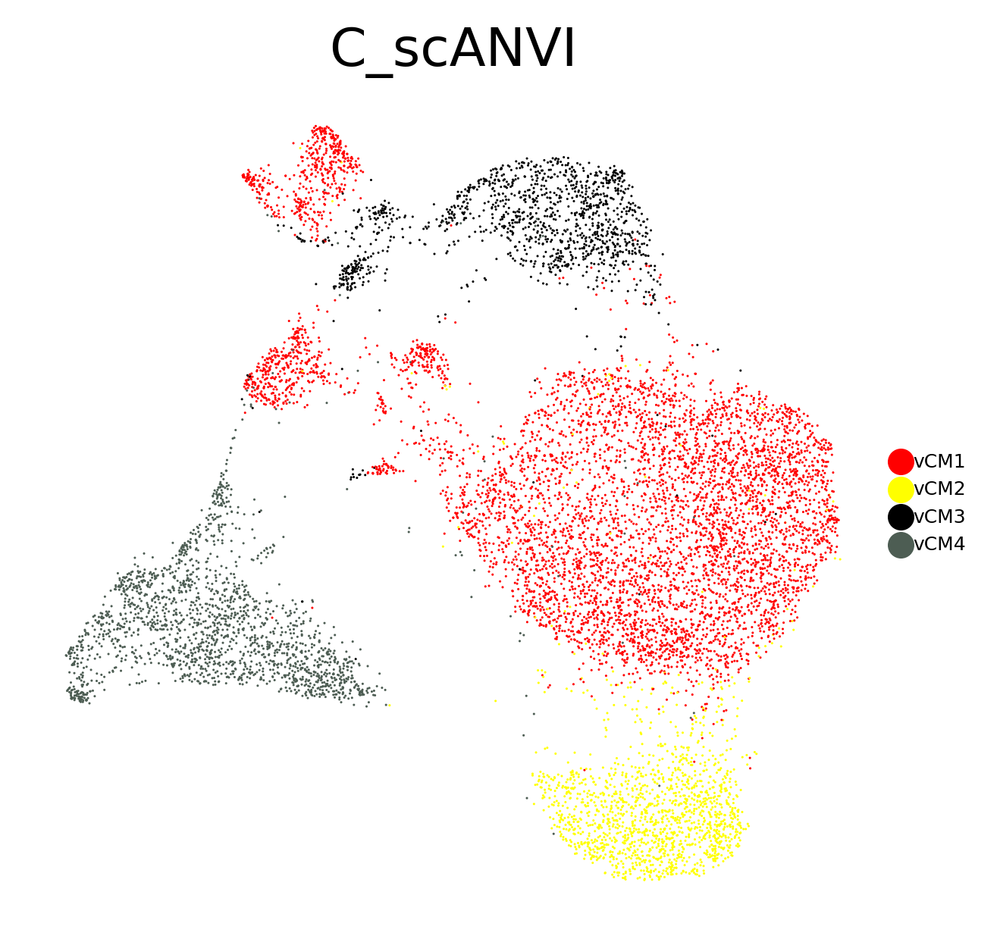

In [38]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI'], size = 1.5, legend_fontsize = 5, ncols = 4, palette = bauhaus_colors)

In [39]:
df = adata_toplot.obs.groupby(['genotype', 'C_scANVI']).size().reset_index(name = 'counts')

grouped = df.groupby('genotype')['counts'].apply(lambda x: x / x.sum() * 100)
grouped = grouped.reset_index()

df['proportions'] = grouped['counts']
df['waffle_counts'] = (df['proportions'] * 10).astype(int)

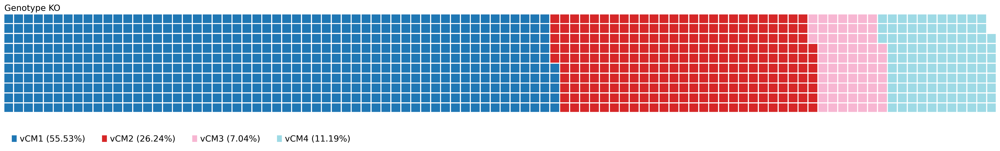

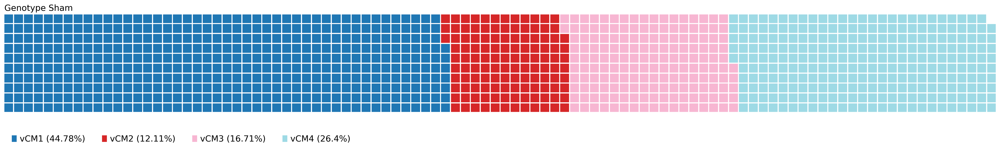

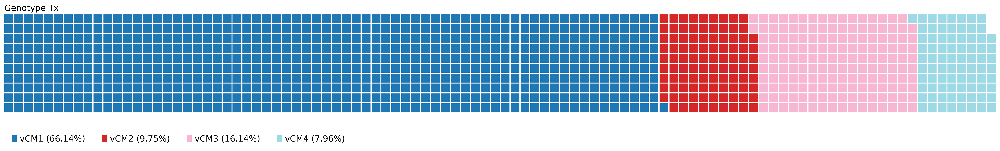

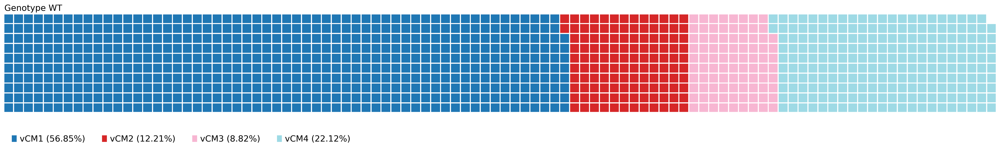

In [40]:
tab20_palette = plt.cm.get_cmap('tab20', len(df['C_scANVI'].unique()))


for group in df['genotype'].unique():
    temp_df = df[df['genotype'] == group]
    
    data = dict(zip(temp_df['C_scANVI'], temp_df['waffle_counts']))
    colors = [tab20_palette(i) for i in range(len(temp_df['C_scANVI']))]
    fig = plt.figure(
        FigureClass = Waffle, 
        rows = 10, 
        values = data, 
        title = {'label': f'Genotype {group}', 'loc': 'left', 'fontsize': 14},
        labels = [f"{k} ({v}%)" for k, v in zip(temp_df['C_scANVI'], temp_df['proportions'].round(2))],
        #legend = {'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': len(data), 'framealpha': 0},
        legend = {'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': 10, 'framealpha': 0, 'fontsize': 14},
        figsize = (40, 4),
        colors = colors
    )
    plt.show()

### Export annotated sample object 

In [41]:
adata.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata.obs.index])
adata.obs.index

Index(['AAACAGCCAGGCCATT-1-KDM6A_wt_11', 'AAACATGCAAACCTAT-1-KDM6A_wt_11',
       'AAACATGCACACCAAC-1-KDM6A_wt_11', 'AAACCAACAAACAACA-1-KDM6A_wt_11',
       'AAACCAACAGTTTCTC-1-KDM6A_wt_11', 'AAACCGAAGGTGAGAC-1-KDM6A_wt_11',
       'AAACCGAAGTCATTAG-1-KDM6A_wt_11', 'AAACCGCGTTAAGTGT-1-KDM6A_wt_11',
       'AAACCGCGTTACCGGG-1-KDM6A_wt_11', 'AAACGCGCAGTATGTT-1-KDM6A_wt_11',
       ...
       'TTTGAGTCATAAGCAA-1-GSKJ4_treat_52',
       'TTTGAGTCATGCAACC-1-GSKJ4_treat_52',
       'TTTGAGTCATGCTCCC-1-GSKJ4_treat_52',
       'TTTGCATTCGGTTTCC-1-GSKJ4_treat_52',
       'TTTGGCTGTAAGCACC-1-GSKJ4_treat_52',
       'TTTGGCTGTTCACCAT-1-GSKJ4_treat_52',
       'TTTGGTAAGGGATTAG-1-GSKJ4_treat_52',
       'TTTGTCTAGTACTGGT-1-GSKJ4_treat_52',
       'TTTGTCTAGTCATGCG-1-GSKJ4_treat_52',
       'TTTGTTGGTCCTAACT-1-GSKJ4_treat_52'],
      dtype='object', length=10793)

In [42]:
adata_raw.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata_raw.obs.index])
adata_raw.obs.index

Index(['AAACAGCCAGGCCATT-1-KDM6A_wt_11', 'AAACATGCAAACCTAT-1-KDM6A_wt_11',
       'AAACATGCACACCAAC-1-KDM6A_wt_11', 'AAACCAACAAACAACA-1-KDM6A_wt_11',
       'AAACCAACAGTTTCTC-1-KDM6A_wt_11', 'AAACCGAAGGTGAGAC-1-KDM6A_wt_11',
       'AAACCGAAGTCATTAG-1-KDM6A_wt_11', 'AAACCGCGTTAAGTGT-1-KDM6A_wt_11',
       'AAACCGCGTTACCGGG-1-KDM6A_wt_11', 'AAACGCGCAGTATGTT-1-KDM6A_wt_11',
       ...
       'TTTGAGTCATAAGCAA-1-GSKJ4_treat_52',
       'TTTGAGTCATGCAACC-1-GSKJ4_treat_52',
       'TTTGAGTCATGCTCCC-1-GSKJ4_treat_52',
       'TTTGCATTCGGTTTCC-1-GSKJ4_treat_52',
       'TTTGGCTGTAAGCACC-1-GSKJ4_treat_52',
       'TTTGGCTGTTCACCAT-1-GSKJ4_treat_52',
       'TTTGGTAAGGGATTAG-1-GSKJ4_treat_52',
       'TTTGTCTAGTACTGGT-1-GSKJ4_treat_52',
       'TTTGTCTAGTCATGCG-1-GSKJ4_treat_52',
       'TTTGTTGGTCCTAACT-1-GSKJ4_treat_52'],
      dtype='object', length=10793)

In [43]:
adata.obs_names

Index(['AAACAGCCAGGCCATT-1-KDM6A_wt_11', 'AAACATGCAAACCTAT-1-KDM6A_wt_11',
       'AAACATGCACACCAAC-1-KDM6A_wt_11', 'AAACCAACAAACAACA-1-KDM6A_wt_11',
       'AAACCAACAGTTTCTC-1-KDM6A_wt_11', 'AAACCGAAGGTGAGAC-1-KDM6A_wt_11',
       'AAACCGAAGTCATTAG-1-KDM6A_wt_11', 'AAACCGCGTTAAGTGT-1-KDM6A_wt_11',
       'AAACCGCGTTACCGGG-1-KDM6A_wt_11', 'AAACGCGCAGTATGTT-1-KDM6A_wt_11',
       ...
       'TTTGAGTCATAAGCAA-1-GSKJ4_treat_52',
       'TTTGAGTCATGCAACC-1-GSKJ4_treat_52',
       'TTTGAGTCATGCTCCC-1-GSKJ4_treat_52',
       'TTTGCATTCGGTTTCC-1-GSKJ4_treat_52',
       'TTTGGCTGTAAGCACC-1-GSKJ4_treat_52',
       'TTTGGCTGTTCACCAT-1-GSKJ4_treat_52',
       'TTTGGTAAGGGATTAG-1-GSKJ4_treat_52',
       'TTTGTCTAGTACTGGT-1-GSKJ4_treat_52',
       'TTTGTCTAGTCATGCG-1-GSKJ4_treat_52',
       'TTTGTTGGTCCTAACT-1-GSKJ4_treat_52'],
      dtype='object', length=10793)

In [44]:
adata.obs['C_scANVI'].cat.categories

Index(['vCM1', 'vCM2', 'vCM3', 'vCM4'], dtype='object')

In [45]:
adata.obs['C_scANVI'].value_counts()

C_scANVI
vCM1    5969
vCM4    1931
vCM2    1578
vCM3    1315
Name: count, dtype: int64

### Export annotated object with raw counts

In [46]:
adata

AnnData object with n_obs × n_vars = 10793 × 7000
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'genotype_colors', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'sample_colors', 'C_scANVI_colors', 'seed_labels_colors', 'batch_colors', 'pca'
    obsm: '_scvi_extra_categorical_covs', 'X_scVI', 'X_scANVI', 'X_

In [47]:
adata_raw

AnnData object with n_obs × n_vars = 10793 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'genotype_colors'

In [48]:
adata_export = anndata.AnnData(X = adata_raw.X, obs = adata.obs, var = adata_raw.var)
adata_export.obsm['X_scVI'] = adata.obsm['X_scVI'].copy()
adata_export.obsm['X_umap'] = adata.obsm['X_umap'].copy()
adata_export.obsm['X_scANVI'] = adata.obsm['X_scANVI'].copy()
adata_export

AnnData object with n_obs × n_vars = 10793 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_scVI', 'X_umap', 'X_scANVI'